In [1]:
import cv2 as cv
import numpy as np
from shapely.geometry import Polygon, Point
from google.colab.patches import cv2_imshow

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


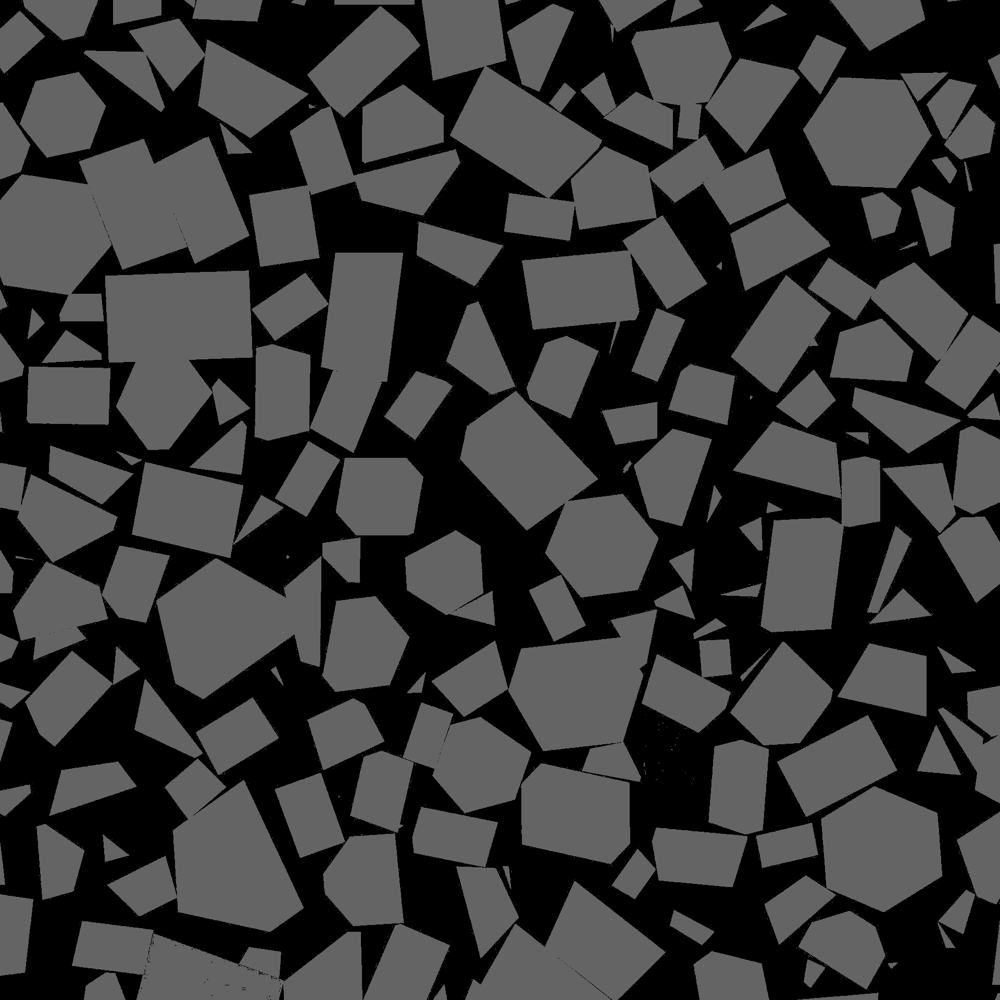

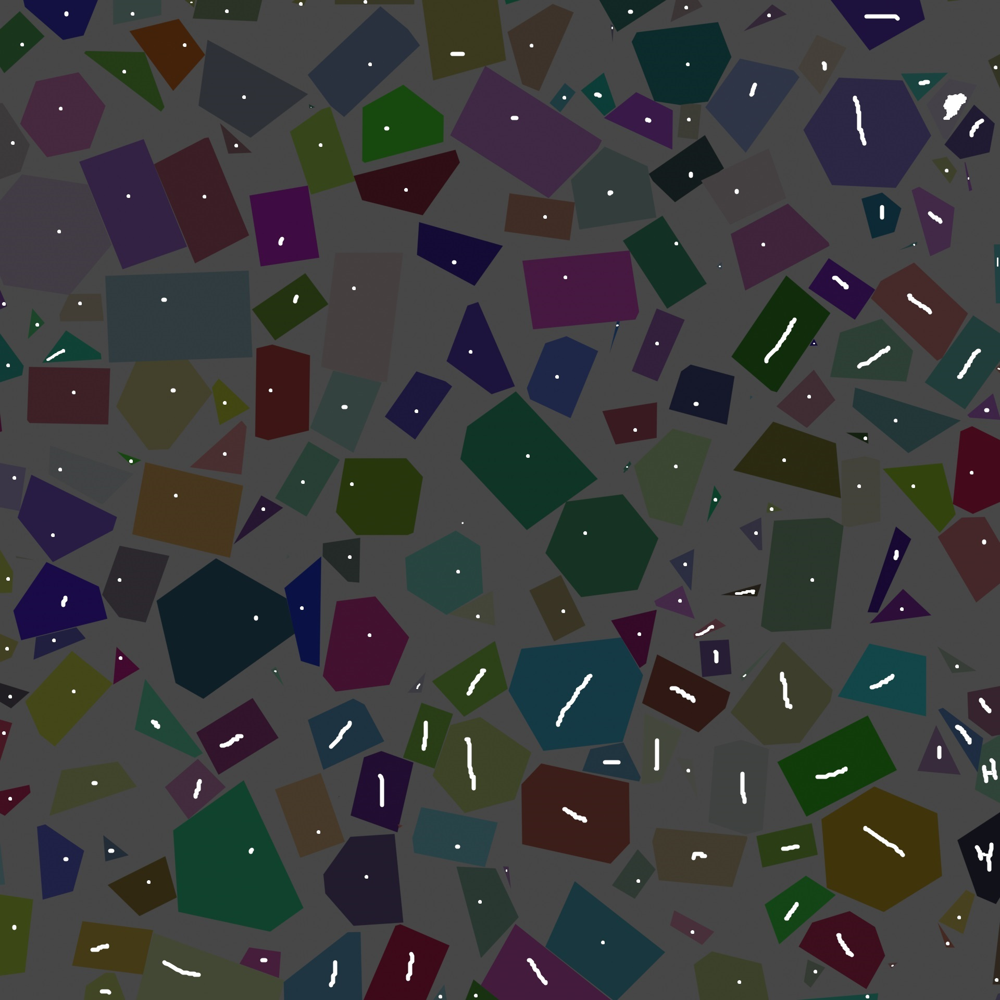

In [3]:
img = cv.imread("/content/drive/MyDrive/WC_Co/liza_grains_4.jpg", cv.IMREAD_GRAYSCALE)
marked = cv.imread("/content/drive/MyDrive/WC_Co/liza_grains_4_marked.jpg")
ret, thresh = cv.threshold(img, 68, 100, cv.THRESH_BINARY_INV)
cv2_imshow(thresh)
cv2_imshow(marked)

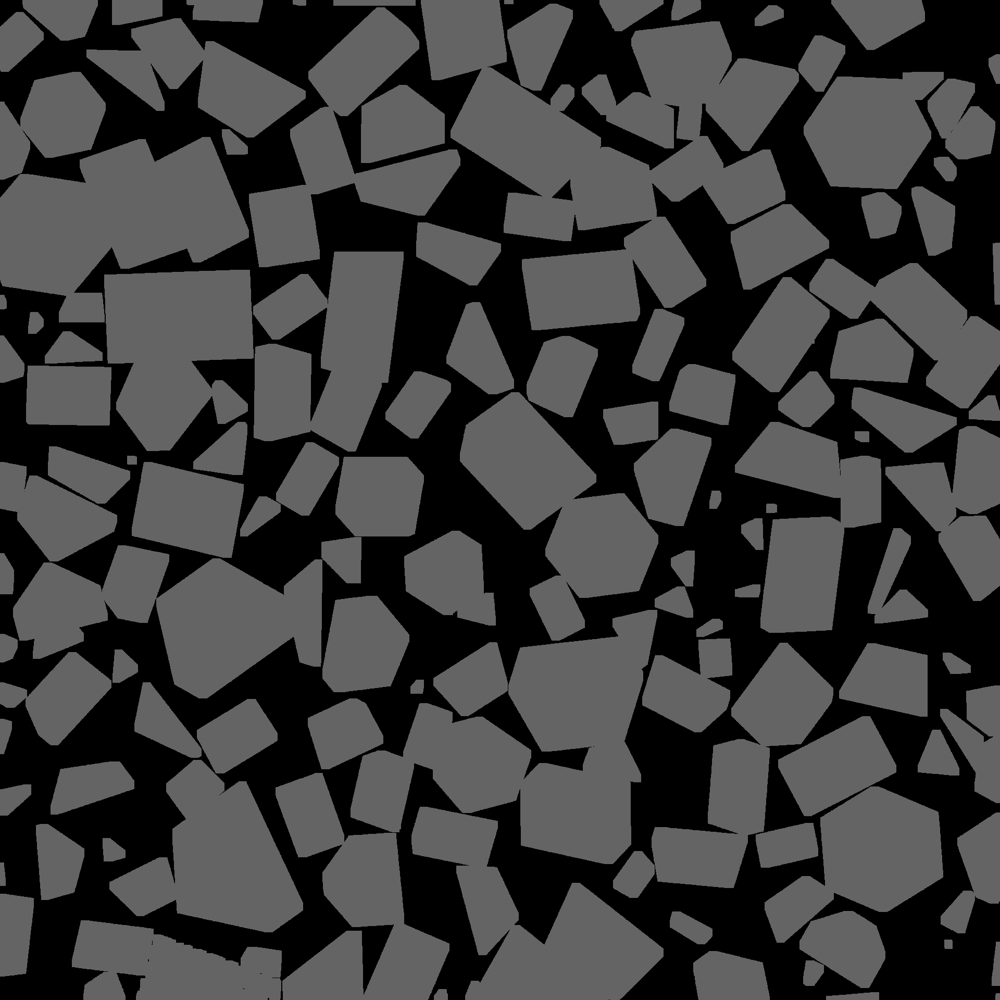

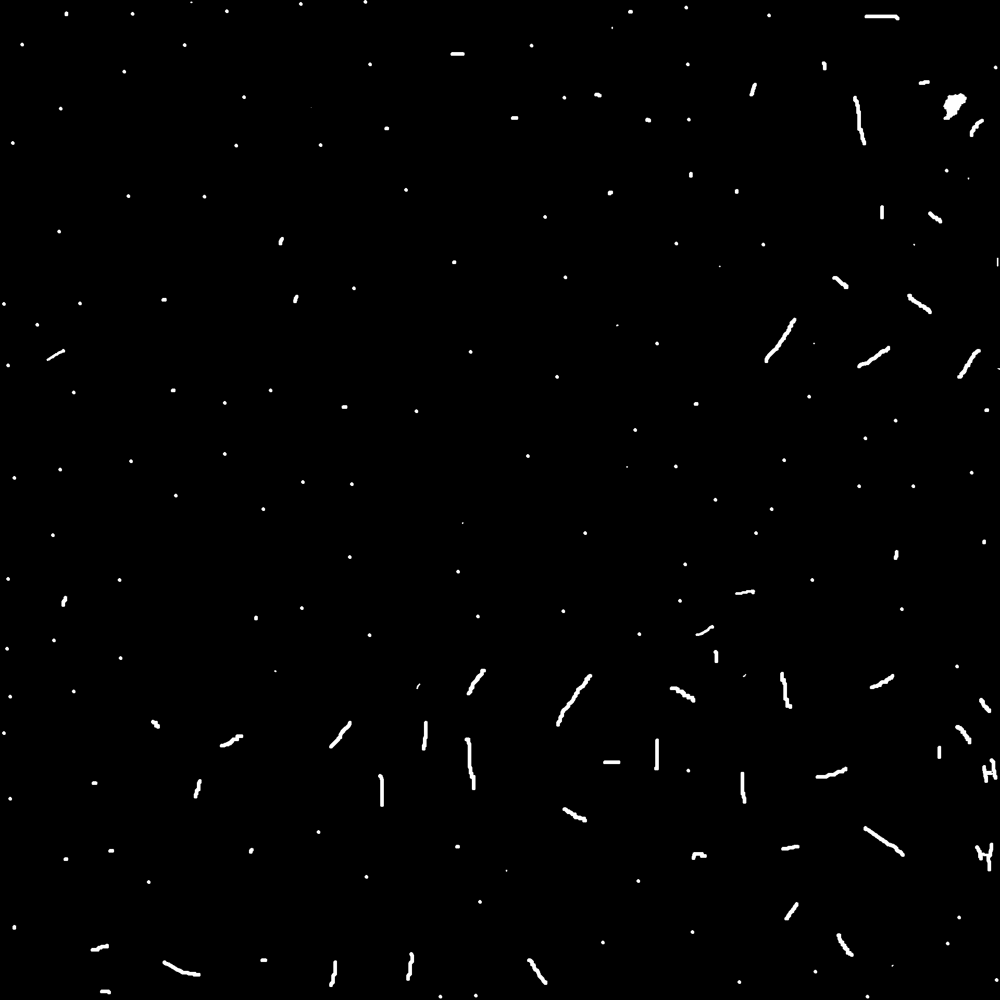

In [4]:
kernel = np.ones((3,3), np.uint8)

opening = cv.morphologyEx(thresh, cv.MORPH_OPEN, kernel, iterations = 5)

sure_bg = cv.dilate(opening, kernel, iterations = 2)

marked_img = cv.imread("/content/drive/MyDrive/WC_Co/liza_grains_4_marked.jpg")
img = cv.imread("/content/drive/MyDrive/WC_Co/liza_grains_4.jpg")
hsv_min = np.array((200,200, 200), np.uint8)
hsv_max = np.array((255, 255, 255), np.uint8)
thresh = cv.inRange(marked_img, hsv_min, hsv_max)


sure_fg = thresh

cv2_imshow(sure_bg)
cv2_imshow(sure_fg)

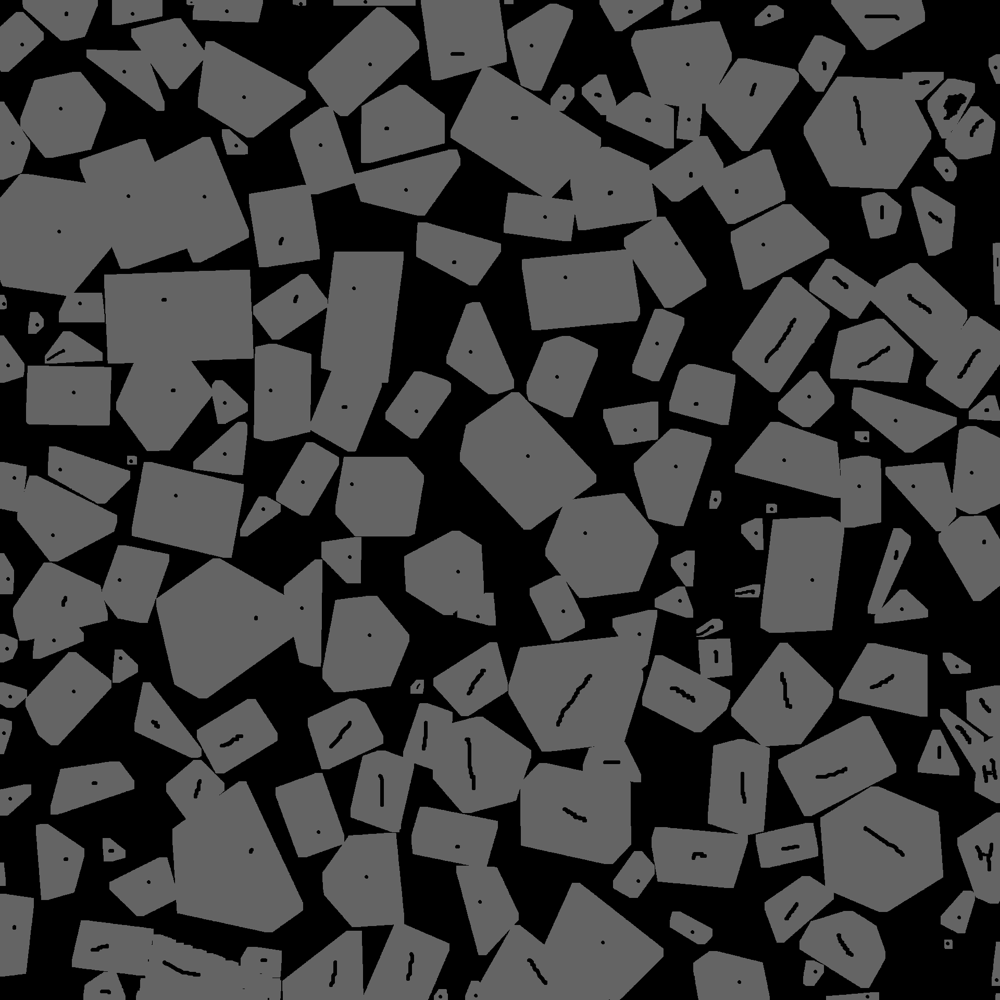

In [5]:
sure_fg = np.uint8(sure_fg)
unknown = cv.subtract(sure_bg,sure_fg)
cv2_imshow(unknown)

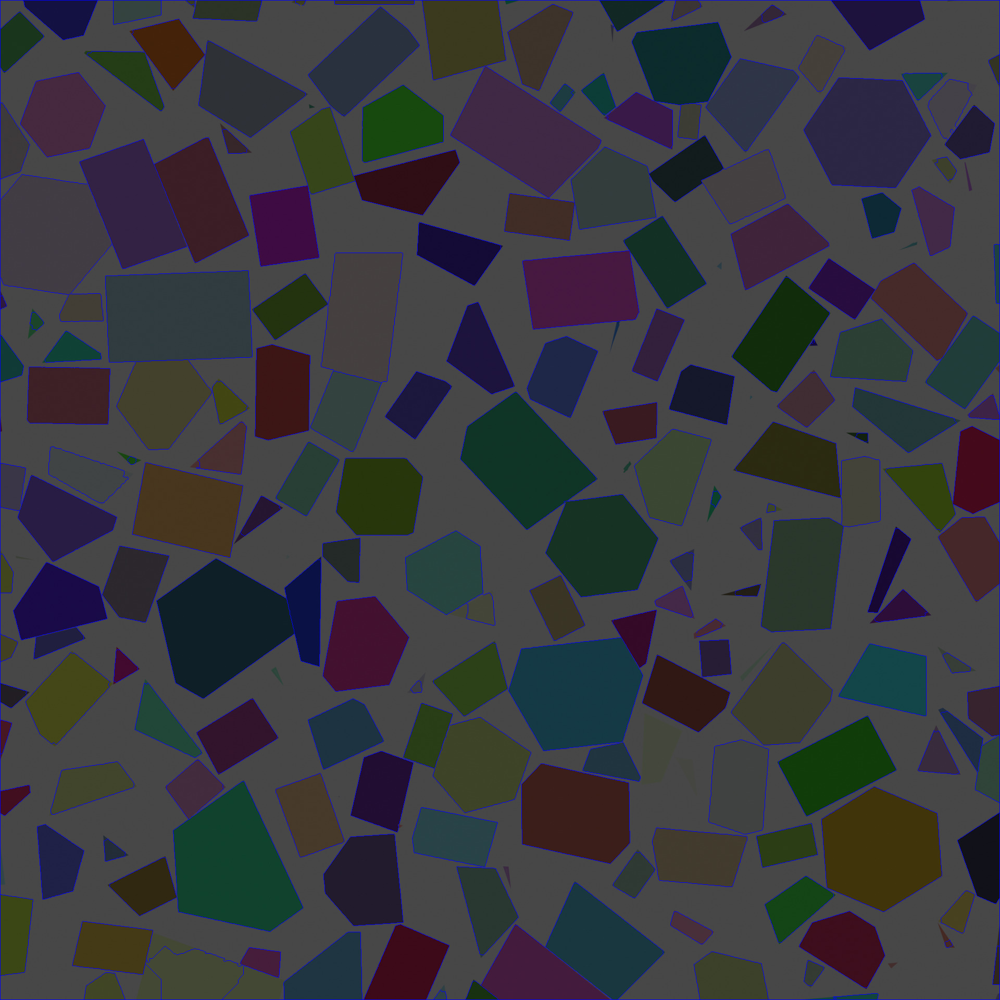

array([[  0,   0,   0, ...,   0,   0,   0],
       [  0,   0,   0, ...,   0,   0,   0],
       [  0,   0,   0, ...,   0,   0,   0],
       ...,
       [  0,   0,   0, ..., 100, 100, 100],
       [  0,   0,   0, ..., 100, 100, 100],
       [  0,   0,   0, ..., 100, 100, 100]], dtype=uint8)

In [6]:
img_real = cv.imread("/content/drive/MyDrive/WC_Co/liza_grains_4.jpg")
cv.cvtColor(img_real, cv.COLOR_BGR2GRAY)
ret, markers = cv.connectedComponents(sure_fg)
markers = markers + 1
markers[unknown > 50] = 0
# img_real = cv.medianBlur(img_real, 3)
markers = cv.watershed(img_real, markers)

img_real[markers == -1] = [255, 0, 0]
cv2_imshow(img_real)
unknown

eps= 0.01


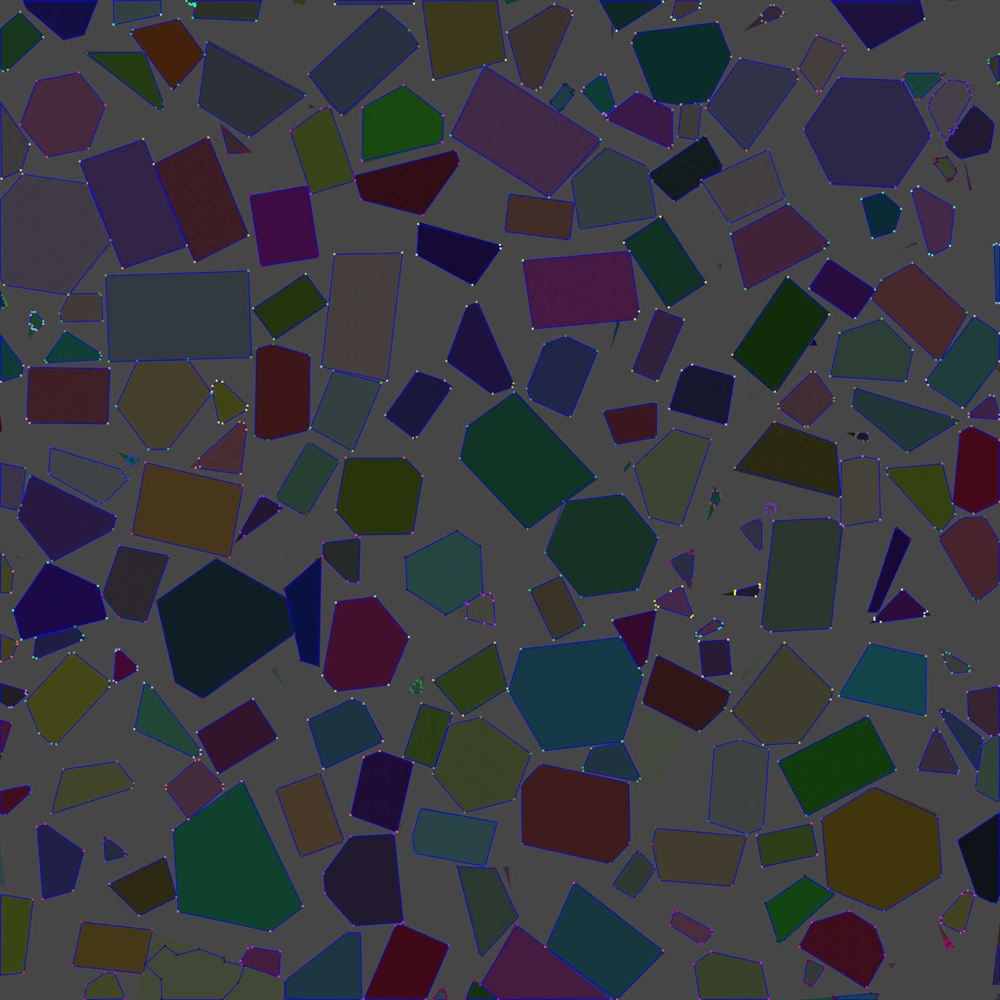

eps= 0.025


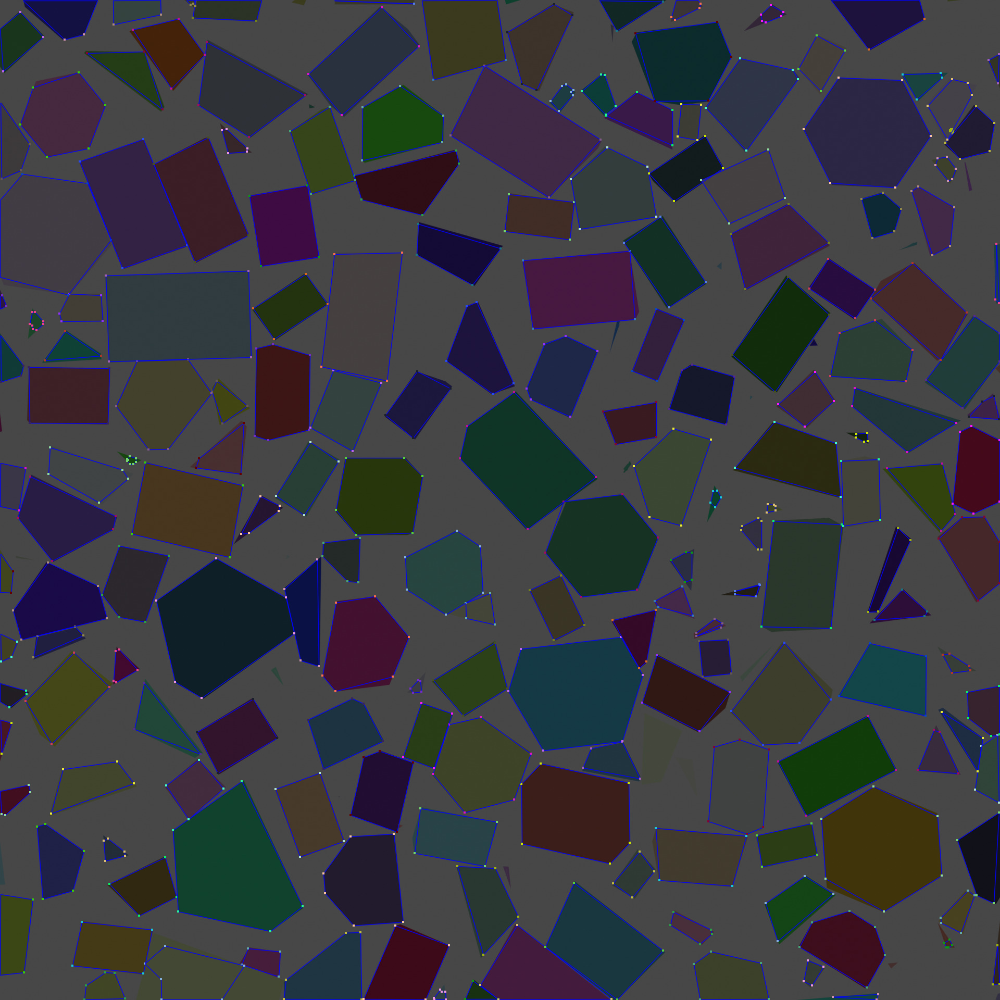

eps= 0.04


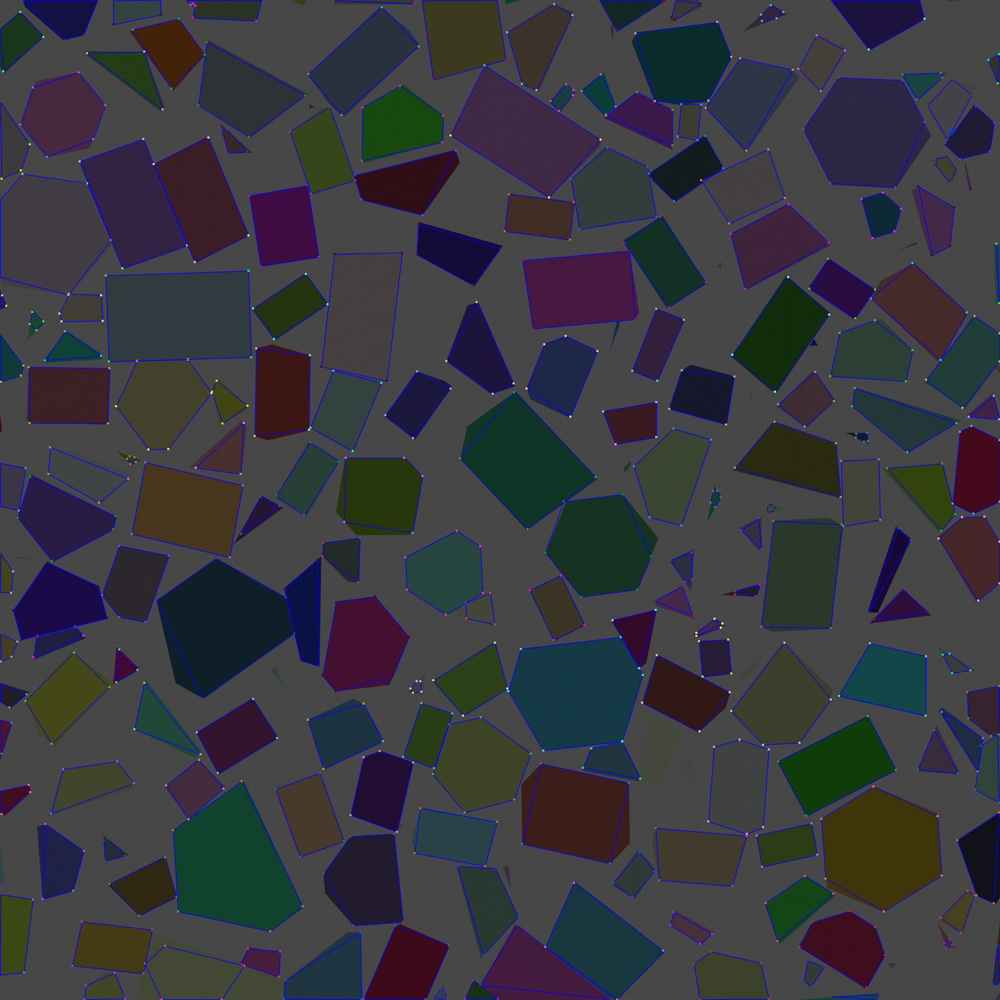

eps= 0.05500000000000001


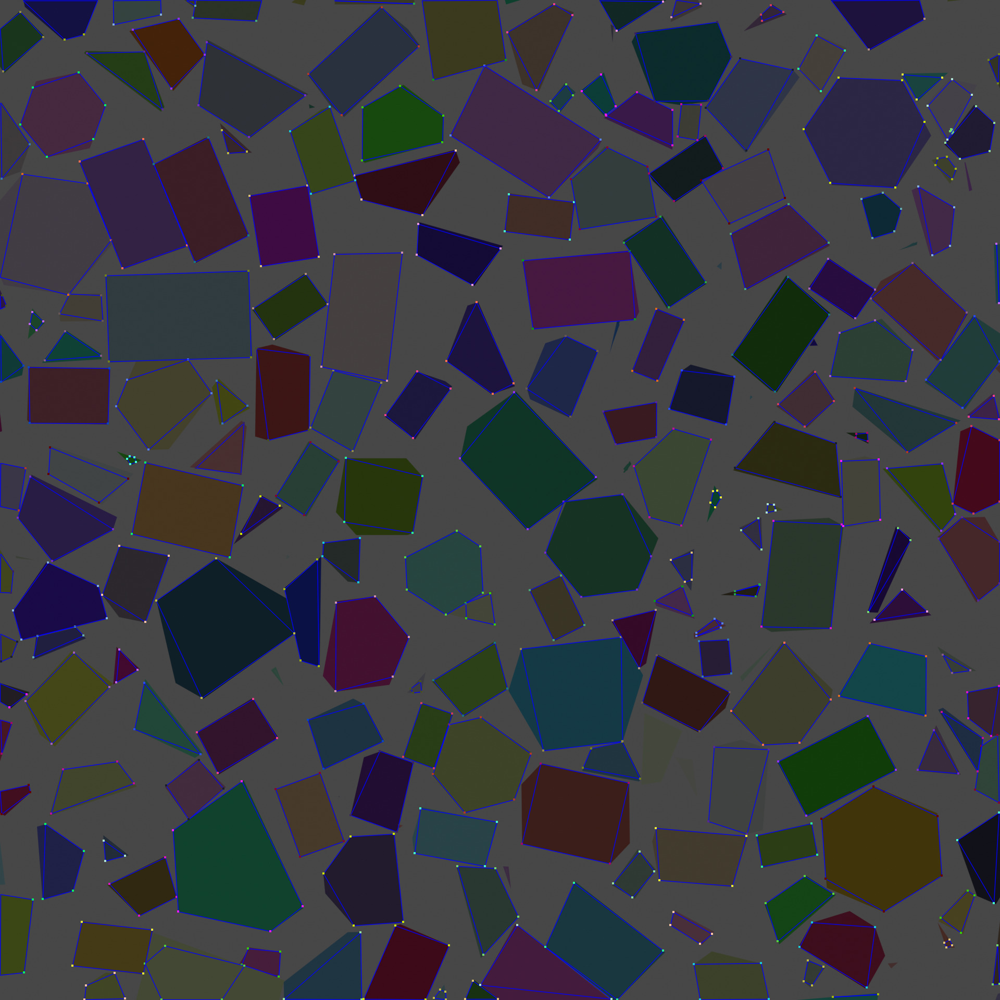

eps= 0.07


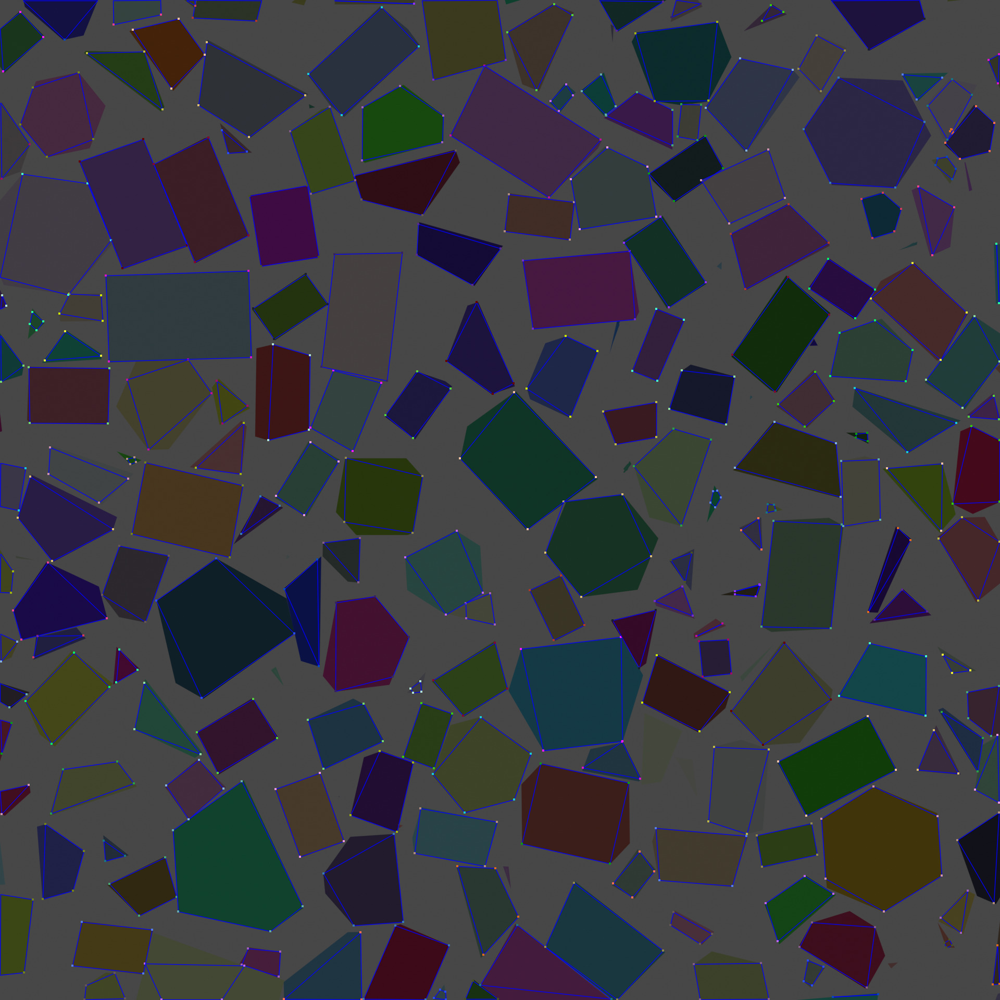

In [7]:

img = cv.imread("/content/drive/MyDrive/WC_Co/liza_grains_4.jpg")
img[::] = [0, 0, 0]
img[markers == -1] = [255, 0, 0]
gray = cv.cvtColor(img,cv.COLOR_BGR2GRAY)
ret, thresh = cv.threshold(gray,0,255,cv.THRESH_OTSU)
img[:] = 0
contours, hierarchy = cv.findContours( thresh, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)

new_cntrs = [contours[ind] for h, ind in zip(hierarchy[0], range(len(hierarchy[0]))) if h[2] == -1]
cv.drawContours(img, contours, -1, (255,255,0), 1, cv.LINE_AA)
cv.drawContours(img, new_cntrs, -1, (255,0,0), 1, cv.LINE_AA)

starting_color = [0,0,100]
img_new = cv.imread("/content/drive/MyDrive/WC_Co/liza_grains_4.jpg")
for eps in np.linspace(0.01, 0.07, 5):
    img = img_new.copy() 
    print('eps=', eps)
    for cnt_arr in new_cntrs:
        epsilon = eps * cv.arcLength(cnt_arr, True)
        approx = cv.approxPolyDP(cnt_arr, epsilon, True)
        cv.drawContours(img, [approx], -1, (255,0,0), 1, cv.LINE_AA)
        for cn in approx:
            img[cn[0][1] - 2:cn[0][1] + 2, cn[0][0]-2:cn[0][0]+2] = starting_color
        starting_color = ((starting_color[0] + 50) % 255, (starting_color[1] + 5) % 255, (starting_color[2] + 30) % 255)
    cv2_imshow(img)
    cv.waitKey()
    cv.destroyAllWindows()

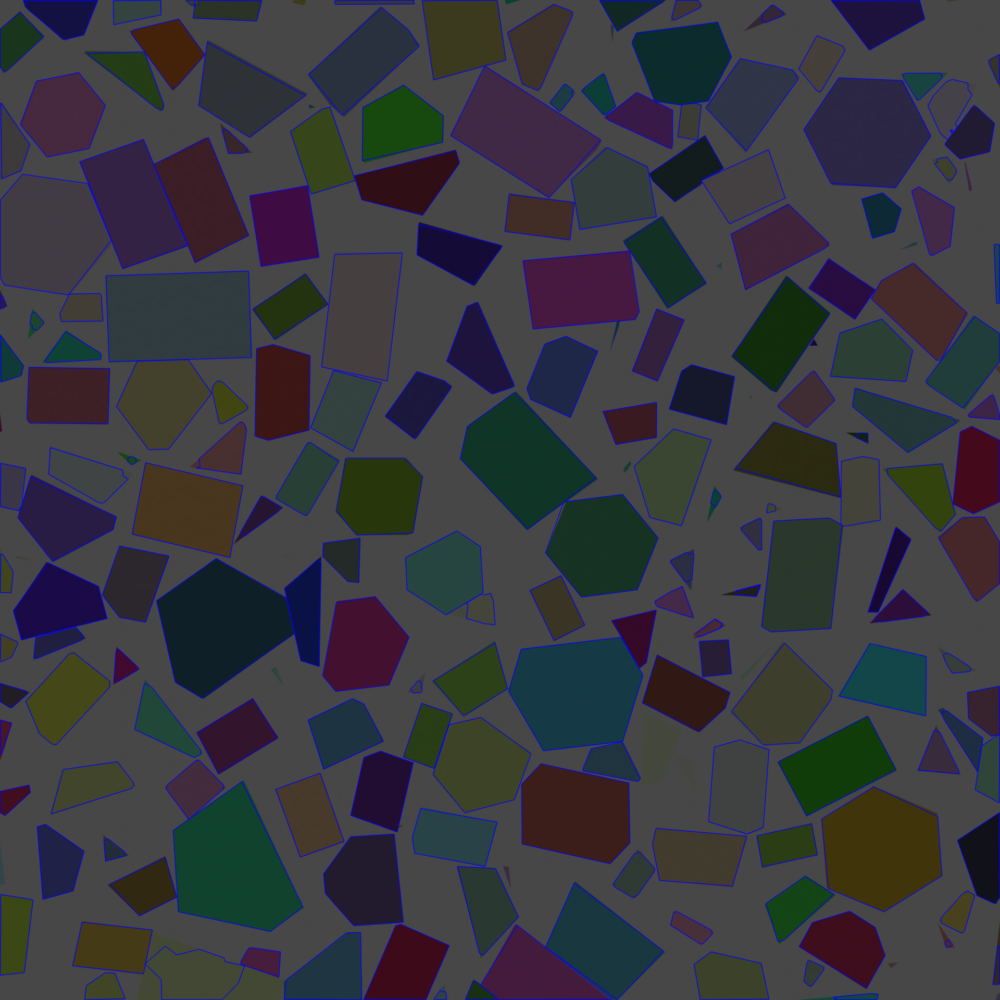

In [11]:
# Аппроксимируем контуры с нужной точностью
eps = 0.01
approxed_cnt = []
for cnt_arr in new_cntrs:
  epsilon = eps * cv.arcLength(cnt_arr, True)
  approx = cv.approxPolyDP(cnt_arr, epsilon, True)
  approxed_cnt.append(approx)

img_fresh = cv.imread("/content/drive/MyDrive/WC_Co/liza_grains_4.jpg")
cv.drawContours(img_fresh, approxed_cnt, -1, (255,0,0), 1, cv.LINE_AA)
cv2_imshow(img_fresh)

# повышение контрастности границ (не запускать)

попытка добавить контрастности границам, чтобы избежать их недовыделения, но проблема оказалась не в них

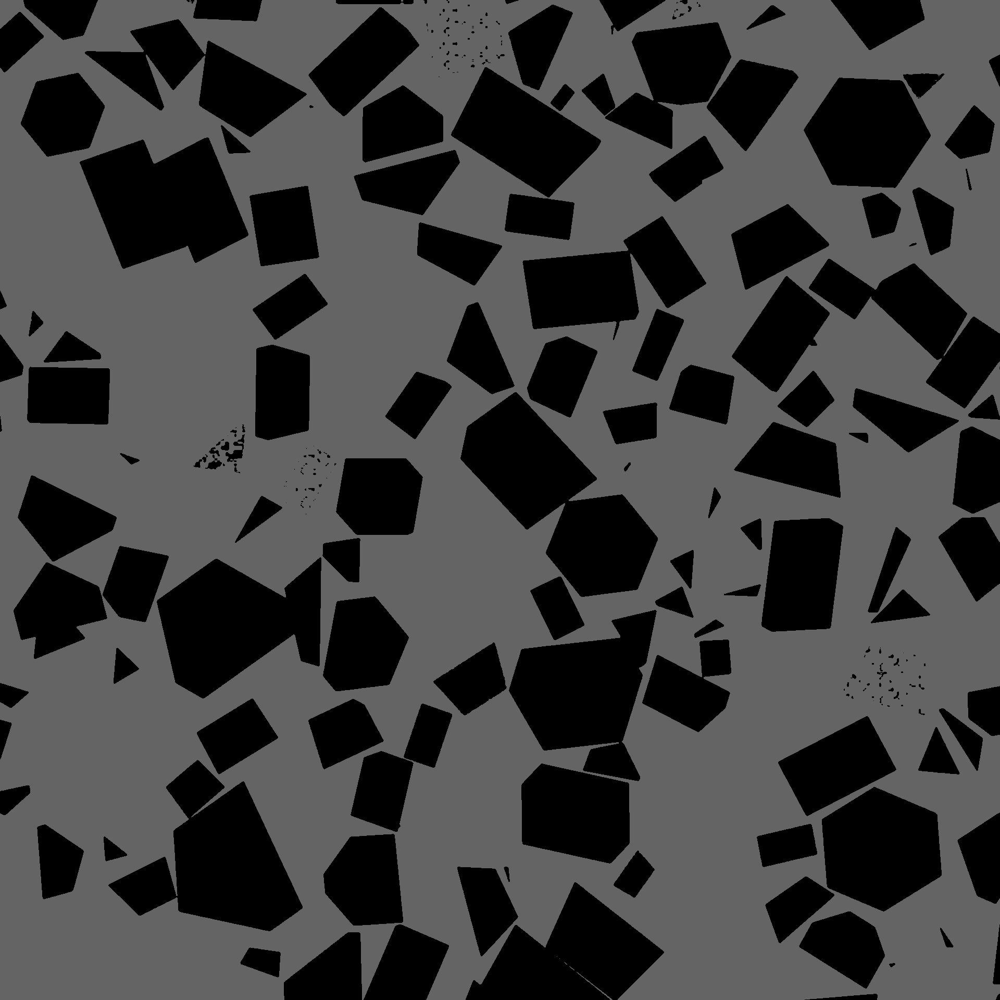

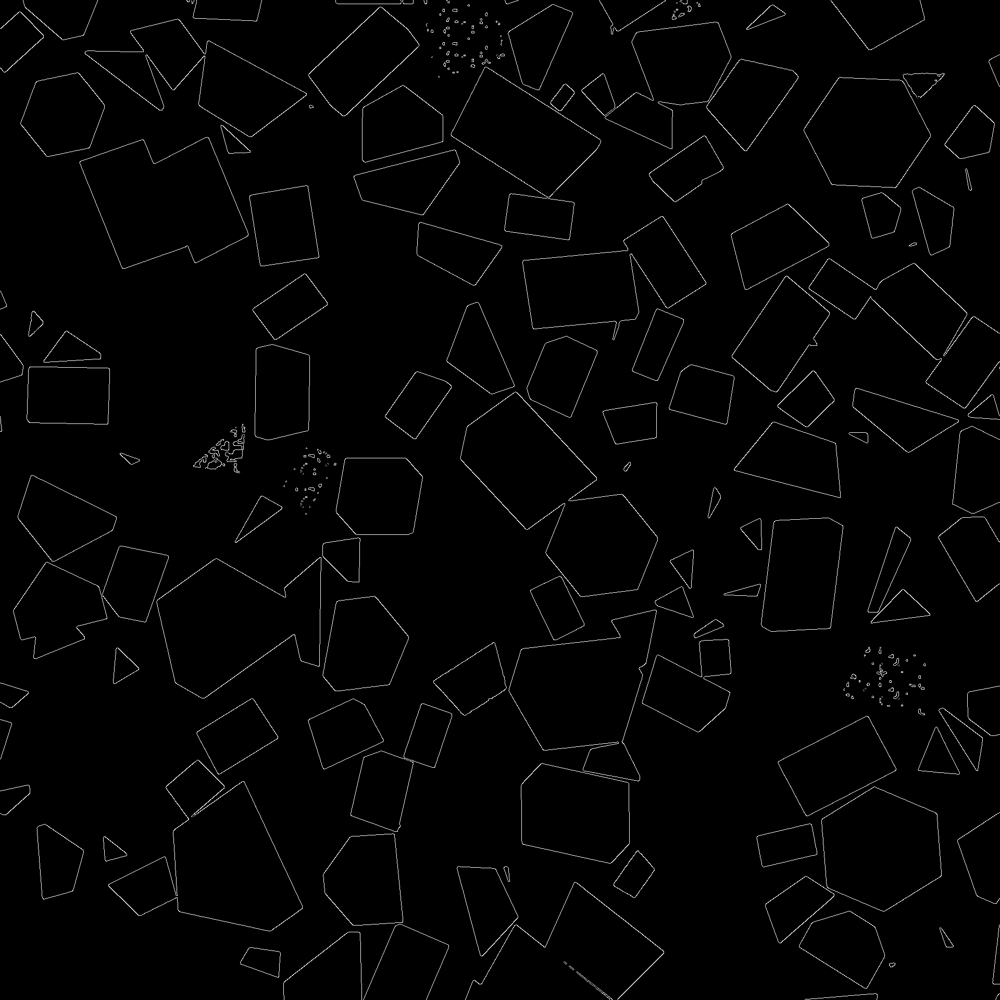

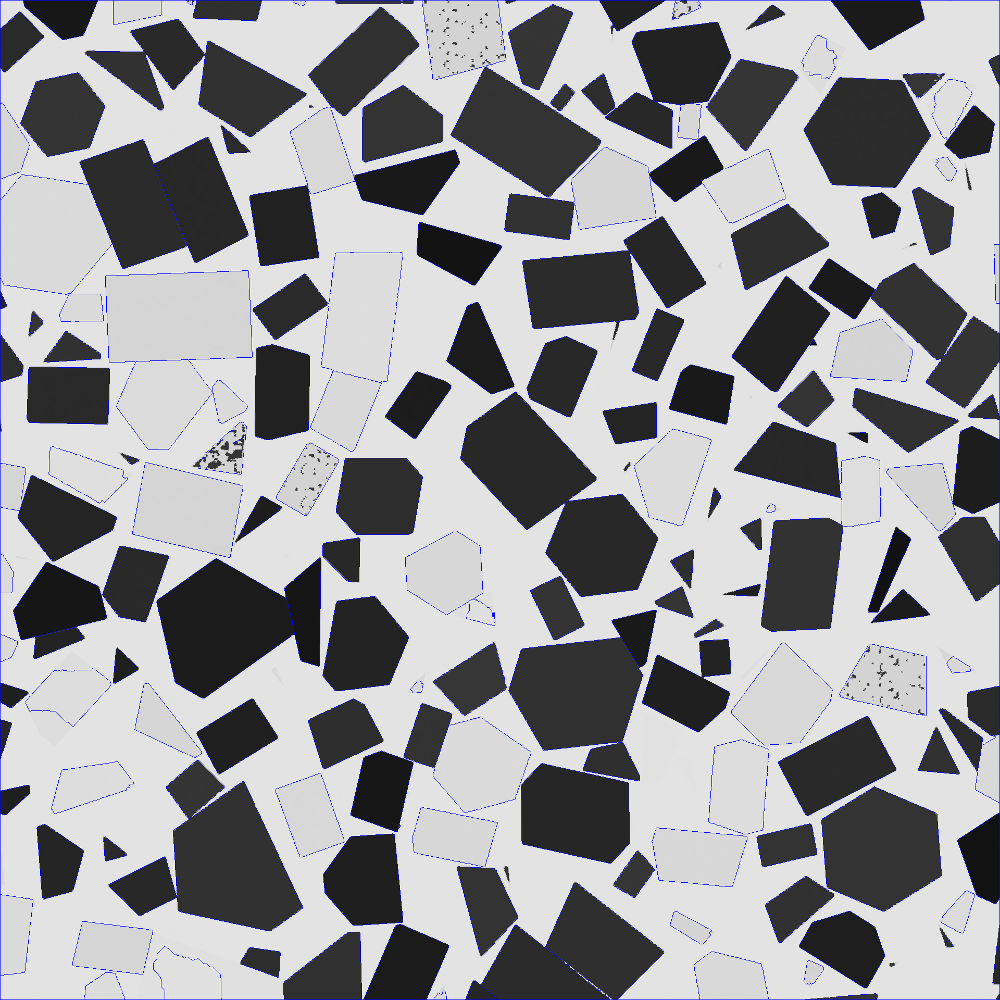

In [9]:
img = cv.imread("/content/drive/MyDrive/WC_Co/liza_grains_4.jpg", cv.IMREAD_GRAYSCALE)
denoised = cv.medianBlur(img, 5)
ret, thresh = cv.threshold(denoised, 67, 100, cv.THRESH_BINARY+cv.THRESH_OTSU)
cv2_imshow(thresh)
img_contrs = cv.Canny(thresh, 100, 200)
cv2_imshow(img_contrs)
impowered = (thresh + img_contrs) * 127  + img
impowered = cv.cvtColor(impowered, cv.COLOR_GRAY2RGB)
# impowered = cv.medianBlur(impowered, 5)
ret, markers = cv.connectedComponents(sure_fg)
markers = markers + 1
markers[unknown > 50] = 0
markers = cv.watershed(impowered, markers)

impowered[markers == -1] = [255, 0, 0]
cv2_imshow(impowered)

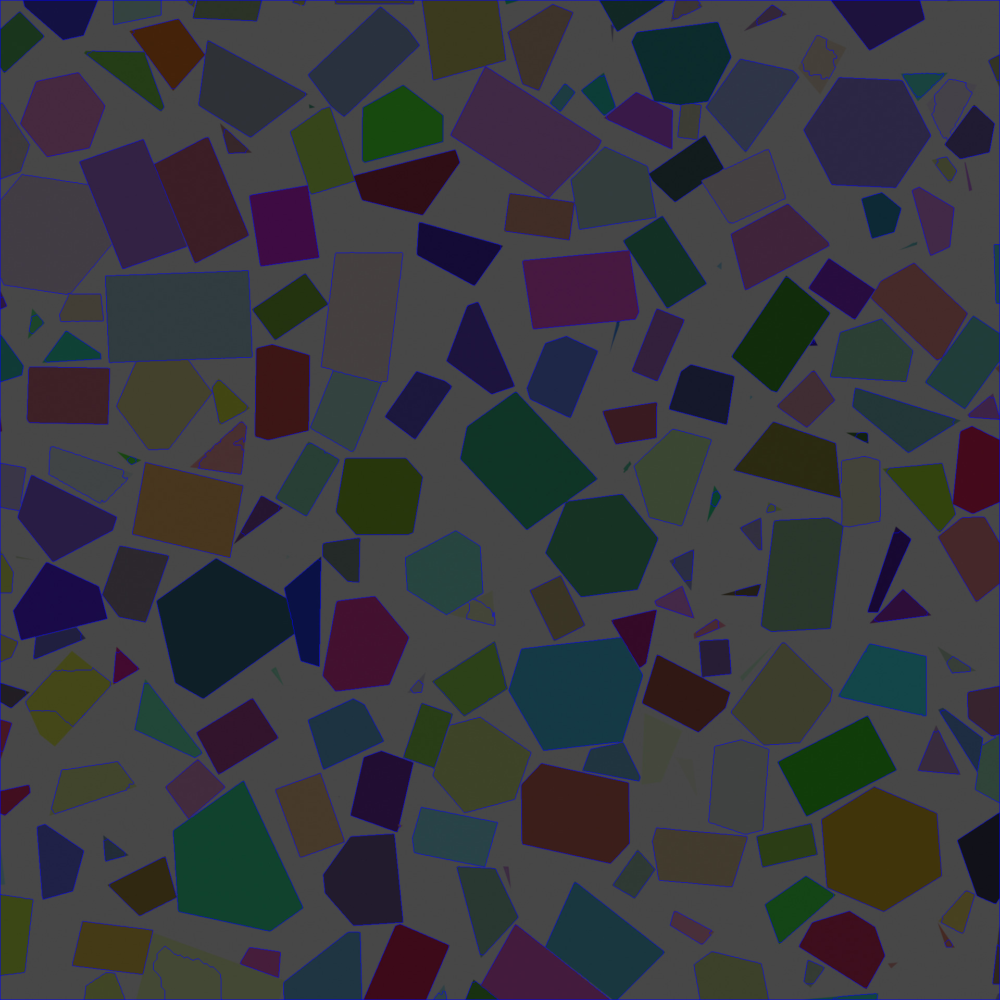

In [10]:

img_real = cv.imread("/content/drive/MyDrive/WC_Co/liza_grains_4.jpg")
ret, markers = cv.connectedComponents(sure_fg)
markers = markers + 1
markers[unknown > 50] = 0
markers = cv.watershed(impowered, markers)

img_real[markers == -1] = [255, 0, 0]

cv2_imshow(img_real)

# Подсчет распределения

Посчитаем распрделение расстояния между зернами от угла

In [12]:
from itertools import combinations

In [14]:
# Элемент данного листа - координаты вершин зерна
approxed_cnt

[array([[[1686, 1909]],
 
        [[1683, 1919]],
 
        [[1601, 1919]],
 
        [[1606, 1916]],
 
        [[1599, 1914]],
 
        [[1672, 1907]]], dtype=int32),
 array([[[ 833, 1916]],
 
        [[ 838, 1911]],
 
        [[ 845, 1900]],
 
        [[ 848, 1904]],
 
        [[ 849, 1903]],
 
        [[ 851, 1904]],
 
        [[ 854, 1903]],
 
        [[ 855, 1904]],
 
        [[ 857, 1912]],
 
        [[ 857, 1918]],
 
        [[ 856, 1919]],
 
        [[ 834, 1919]]], dtype=int32),
 array([[[ 893, 1918]],
 
        [[ 908, 1883]],
 
        [[ 914, 1884]],
 
        [[ 956, 1918]]], dtype=int32),
 array([[[ 240, 1917]],
 
        [[ 162, 1919]],
 
        [[ 165, 1892]],
 
        [[ 202, 1867]],
 
        [[ 220, 1868]]], dtype=int32),
 array([[[1332, 1851]],
 
        [[1365, 1827]],
 
        [[1461, 1849]],
 
        [[1476, 1918]],
 
        [[1344, 1919]]], dtype=int32),
 array([[[ 476, 1821]],
 
        [[ 484, 1819]],
 
        [[ 538, 1827]],
 
        [[ 535, 1875]],
 

In [15]:
# Словарь, где номеру зерна сопоставляются все линии, из которых это зерно состоит
grain_lines = {}
for i in range(np.shape(approxed_cnt)[0]):
  grain_lines[str(approxed_cnt[i][0][0][0]) + str(approxed_cnt[i][0][0][1])] = [[approxed_cnt[i][j], approxed_cnt[i][(j + 1) % np.shape(approxed_cnt[i])[0]]] for j in range(np.shape(approxed_cnt[i])[0])]

/usr/local/lib/python3.9/dist-packages/numpy/core/fromnumeric.py:2007: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = asarray(a).shape


# Рассмотрим два отдельных зерна (не важно)

In [ ]:
first_grain = approxed_cnt[141]
second_grain = approxed_cnt[147]

In [ ]:
grain_lines[str(first_grain[0][0][0]) + str(first_grain[0][0][1])]

[[array([[416, 731]], dtype=int32), array([[427, 733]], dtype=int32)],
 [array([[427, 733]], dtype=int32), array([[475, 779]], dtype=int32)],
 [array([[475, 779]], dtype=int32), array([[473, 787]], dtype=int32)],
 [array([[473, 787]], dtype=int32), array([[427, 813]], dtype=int32)],
 [array([[427, 813]], dtype=int32), array([[420, 811]], dtype=int32)],
 [array([[420, 811]], dtype=int32), array([[407, 752]], dtype=int32)],
 [array([[407, 752]], dtype=int32), array([[408, 741]], dtype=int32)],
 [array([[408, 741]], dtype=int32), array([[416, 731]], dtype=int32)]]

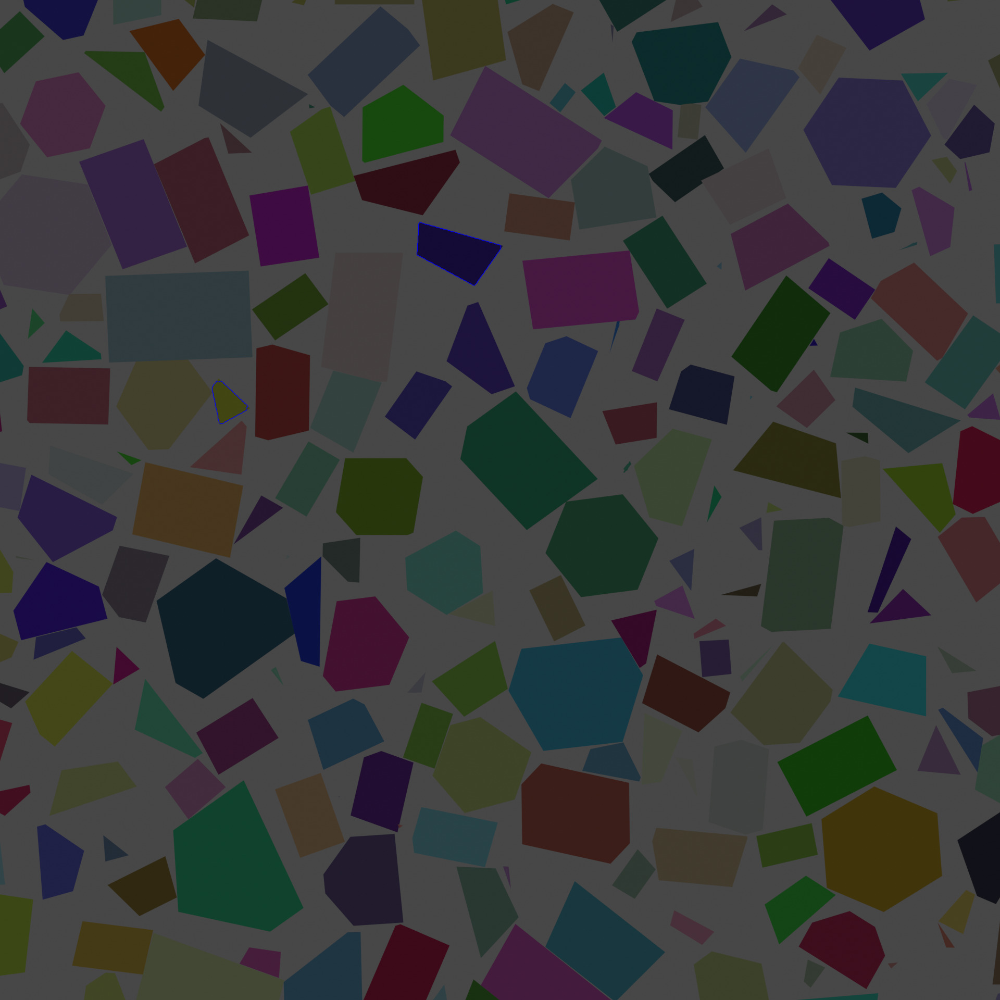

In [ ]:
img_fresh = cv.imread("/content/drive/MyDrive/WC_Co/liza_grains_4.jpg")
cv.drawContours(img_fresh, [first_grain, second_grain], -1, (255,0,0), 1, cv.LINE_AA)
cv2_imshow(img_fresh)

In [ ]:
grain_dist = None
grain_angle = None
for line1 in grain_lines[str(first_grain[0][0][0]) + str(first_grain[0][0][1])]:
  img_fresh = cv.imread("/content/drive/MyDrive/WC_Co/liza_grains_4.jpg")
  lines_dist = None
  lines_angle = None
  for line2 in grain_lines[str(second_grain[0][0][0]) + str(second_grain[0][0][1])]:
    # направляющий вектор
    m1 = (line1[1] - line1[0])[0]
    m2 = (line2[1] - line2[0])[0]
    result = is_correct(line1, line2)
    # print('result', result)
    if result:
      if lines_dist is not None:
        if result < lines_dist:
          lines_dist = result
          lines_angle = angle_between(m1, m2)
          img_fresh = cv.imread("/content/drive/MyDrive/WC_Co/liza_grains_4.jpg")
          img_fresh = cv.line(img_fresh, (line2[0][0][0],line2[0][0][1]), (line2[1][0][0],line2[1][0][1]),(255, 0, 255) )
          img_fresh = cv.line(img_fresh, (line1[0][0][0],line1[0][0][1]), (line1[1][0][0],line1[1][0][1]),(255, 255, 255) )
          print(f'CHANGE lines_dist={lines_dist}, lines_angle={lines_angle}')
          cv2_imshow(img_fresh)
        else:
          pass
      else:
        lines_dist = result
        lines_angle = angle_between(m1, m2)
        img_fresh = cv.imread("/content/drive/MyDrive/WC_Co/liza_grains_4.jpg")
        img_fresh = cv.line(img_fresh, (line2[0][0][0],line2[0][0][1]), (line2[1][0][0],line2[1][0][1]),(255, 0, 255) )
        img_fresh = cv.line(img_fresh, (line1[0][0][0],line1[0][0][1]), (line1[1][0][0],line1[1][0][1]),(255, 255, 255) )
        print(f'NEW lines_dist={lines_dist}, lines_angle={lines_angle}')
        cv2_imshow(img_fresh)
      # print(f'lines_dist={lines_dist}, lines_angle={lines_angle}')
    else:
      continue
    if grain_dist is not None:
      if lines_dist < grain_dist:
        grain_dist = lines_dist
        grain_angle = lines_angle
    else:
      grain_dist = lines_dist
      grain_angle = lines_angle
print('all grain:', grain_angle, grain_dist)
    

# Функционал для подсчета распределения

In [23]:
def unit_vector(vector):
    """ Returns the unit vector of the vector.  """
    return vector / np.linalg.norm(vector)

def angle_between(v1, v2):
    """ Returns the angle in radians between vectors 'v1' and 'v2'::

            >>> angle_between((1, 0, 0), (0, 1, 0))
            1.5707963267948966
            >>> angle_between((1, 0, 0), (1, 0, 0))
            0.0
            >>> angle_between((1, 0, 0), (-1, 0, 0))
            3.141592653589793
    """
    v1_u = unit_vector(v1)
    v2_u = unit_vector(v2)
    angle = np.degrees(np.arccos(np.clip(np.dot(v1_u, v2_u), -1.0, 1.0)))
    return angle if angle <= 90 else 180 - angle

In [24]:
def extract_points(line):
  return [[line[0][0][0], line[0][0][1]], [line[1][0][0], line[1][0][1]]]

In [25]:
# функция, проверяющая можно ли измерить расстояние между отрезками
def is_correct(line1, line2):
  # длина перпендикуляра
  perp_length = None

  # направляющие 
  m1 = (line1[1] - line1[0])[0]
  m2 = (line2[1] - line2[0])[0]
  # нормали
  normal1 = [1 if m1[1] else 0., -m1[0] / m1[1] if m1[1] else 1.]
  normal2 = [1 if m2[1] else 0., -m2[0] / m2[1] if m2[1] else 1.]
  # первый из отрезков хадает прямую, из концов второго проводим перпендикуляры и берем наименьший 
  for point in [(line2[0][0][0],line2[0][0][1]), (line2[1][0][0],line2[1][0][1])]:
    intrs = lines_intersection((line1[0][0][0],line1[0][0][1]), normal1, point, m1)
    if is_between((line1[0][0][0],line1[0][0][1]), (line1[1][0][0],line1[1][0][1]), intrs):
      perp_length = np.min([np.linalg.norm(point - intrs), perp_length]) if perp_length is not None else np.linalg.norm(point - intrs)
    else:
      pass
      # print('1', is_between((line1[0][0][0],line1[0][0][1]), (line1[1][0][0],line1[1][0][1]), intrs))
      # img_fresh = cv.imread("/content/drive/MyDrive/WC_Co/liza_grains_3.jpg")
      # img_fresh = cv.line(img_fresh, (line1[0][0][0],line1[0][0][1]), (line1[1][0][0],line1[1][0][1]),(255, 0, 255) )
      # img_fresh = cv.line(img_fresh, (line2[0][0][0],line2[0][0][1]), (line2[1][0][0],line2[1][0][1]),(255, 255, 255) )
      # img_fresh = cv.circle(img_fresh, (int(intrs[0]), int(intrs[1])), 2, (0, 255, 255), -1)
      # img_fresh = cv.circle(img_fresh, point, 2, (0, 0, 255), -1)
      # cv2_imshow(img_fresh)
  # второй из отрезков задает прямую, из концов первого проводим перпендикуляры и берем наименьший 
  for point in [(line1[0][0][0],line1[0][0][1]), (line1[1][0][0],line1[1][0][1])]:
    intrs = lines_intersection((line2[0][0][0],line2[0][0][1]), normal2, point, m2)
    
    if is_between((line2[0][0][0],line2[0][0][1]), (line2[1][0][0],line2[1][0][1]), intrs):
      perp_length = np.min([np.linalg.norm(point - intrs), perp_length]) if perp_length is not None else np.linalg.norm(point - intrs)
    else:
      pass
      # print(f'NORM?{is_between((line2[0][0][0],line2[0][0][1]), (line2[1][0][0],line2[1][0][1]), intrs)}')
      # img_fresh = cv.imread("/content/drive/MyDrive/WC_Co/liza_grains_3.jpg")
      # img_fresh = cv.line(img_fresh, (line2[0][0][0],line2[0][0][1]), (line2[1][0][0],line2[1][0][1]),(255, 0, 255) )
      # img_fresh = cv.line(img_fresh, (line1[0][0][0],line1[0][0][1]), (line1[1][0][0],line1[1][0][1]),(255, 255, 255) )
      # img_fresh = cv.circle(img_fresh, (int(intrs[0]), int(intrs[1])), 2, (0, 255, 255), -1)
      # img_fresh = cv.circle(img_fresh, point, 2, (0, 0, 255), -1)
      # cv2_imshow(img_fresh)
  # Если перпендикуляров не нашлось, то не рассматриваем такие стороны
  if perp_length is None:
    return False
  segment_length = None
  # соединяем концы отрезков, из получившихся соединений выбираем наименьший
  for point1 in [[line1[0][0][0],line1[0][0][1]], [line1[1][0][0],line1[1][0][1]]]:
    for point2 in [[line2[0][0][0],line2[0][0][1]], [line2[1][0][0],line2[1][0][1]]]:
      point1 = np.array(point1)
      point2 = np.array(point2)
      segment_length = np.min([np.linalg.norm(point1 - point2), segment_length]) if segment_length is not None else np.linalg.norm(point1 - point2)
      # img_fresh = cv.imread("/content/drive/MyDrive/WC_Co/liza_grains_3.jpg")
      # img_fresh = cv.circle(img_fresh, point1, 2, (0, 0, 255), -1)
      # img_fresh = cv.circle(img_fresh, point2, 2, (0, 255, 255), -1)
      # cv2_imshow(img_fresh)
      # print(f'seg_lng={np.linalg.norm(point1 - point2)}')
  # print(np.min([perp_length, segment_length]))
  # Выбираем наименьший из наименьшего из перпендикуляров и наименьшего соединения
  return np.min([perp_length, segment_length])

def lines_intersection(point1, n1, point2, n2):
  """
    point1 - точка, через которую проходит прямая
    point2 - точка, через которую проходит перпендикуляр к прямой
    n1, n2 - нормали к прямой и к перпендикуляру соответственно
  """
  A = [[n1[0], n1[1]], [n2[0], n2[1]]]
  B = [[point1[0] * n1[0] + point1[1] * n1[1]], [point2[0] * n2[0] + point2[1] * n2[1]]]
  return np.transpose(np.linalg.solve(A, B))[0]

import sys
def is_between(point1, point2, point):
  """
    point1, point2 - точки, задающие отрезок
    point - принадлежность этой точки к отрезку проверяется
  """
  point = np.array(point)
  point1 = np.array(point1)
  point2 = np.array(point2)
  return abs(np.linalg.norm(point1 - point) + np.linalg.norm(point2 - point) - np.linalg.norm(point1 - point2)) <= 0.01

In [26]:
def points_amount(x, y, distribution, radius):
  amount = 0
  for a, d in distribution:
    if np.linalg.norm(np.array([x, y]) - np.array([a, d])) < radius:
      amount += 1
  return amount

In [27]:
distribution = []
for cnt_1, cnt_2 in combinations(approxed_cnt, 2):
  grain_dist = None
  grain_angle = None
  for line1 in grain_lines[str(cnt_1[0][0][0]) + str(cnt_1[0][0][1])]:
    lines_dist = None
    lines_angle = None
    for line2 in grain_lines[str(cnt_2[0][0][0]) + str(cnt_2[0][0][1])]:
      # направляющий вектор
      m1 = (line1[1] - line1[0])[0]
      m2 = (line2[1] - line2[0])[0]
      result = is_correct(line1, line2)
      if result:
        if lines_dist is not None:
          if result < lines_dist:
            lines_dist = result
            lines_angle = angle_between(m1, m2)
          else:
            pass
        else:
          lines_dist = result
          lines_angle = angle_between(m1, m2)
      else:
        continue
      if grain_dist is not None:
        if lines_dist < grain_dist:
          grain_dist = lines_dist
          grain_angle = lines_angle
      else:
        grain_dist = lines_dist
        grain_angle = lines_angle
  if grain_dist and grain_dist <= 40:
    distribution.append([grain_angle, grain_dist])
print(distribution)

[[55.07720254124551, 11.713394353856087], [23.198590513648185, 36.0], [21.602236084073922, 13.492985772513446], [0.33118578841441604, 0.1561737618887126], [3.1141180690868566, 5.035640297044423], [10.520784313874344, 21.5417884273484], [6.06074495328599, 0.36177301273990387], [48.37662309317656, 15.231546211727817], [46.17377440875535, 35.79451047110121], [37.47720499529996, 0.8284426489515302], [88.63029869892188, 4.015021359286161], [2.1687700338468687, 13.455707003179356], [1.915459788993104, 0.28688873940132037], [10.855147020873375, 9.345433958510402], [12.485065711259608, 3.621760330983325], [32.905242922987895, 24.074072684316608], [76.3128844814441, 19.019673191620257], [62.04759185488898, 19.0], [36.06296819074163, 3.7765429792680405], [15.227702582613375, 34.68662597370174], [0.750556796364549, 1.1593828079623528e-12], [24.65589874408161, 0.24571804673346875], [34.38876190896326, 35.779603128037536], [15.945395900922875, 27.746833917635193], [0.28888383527979045, 12.948300022

In [28]:
import matplotlib.pyplot as plt

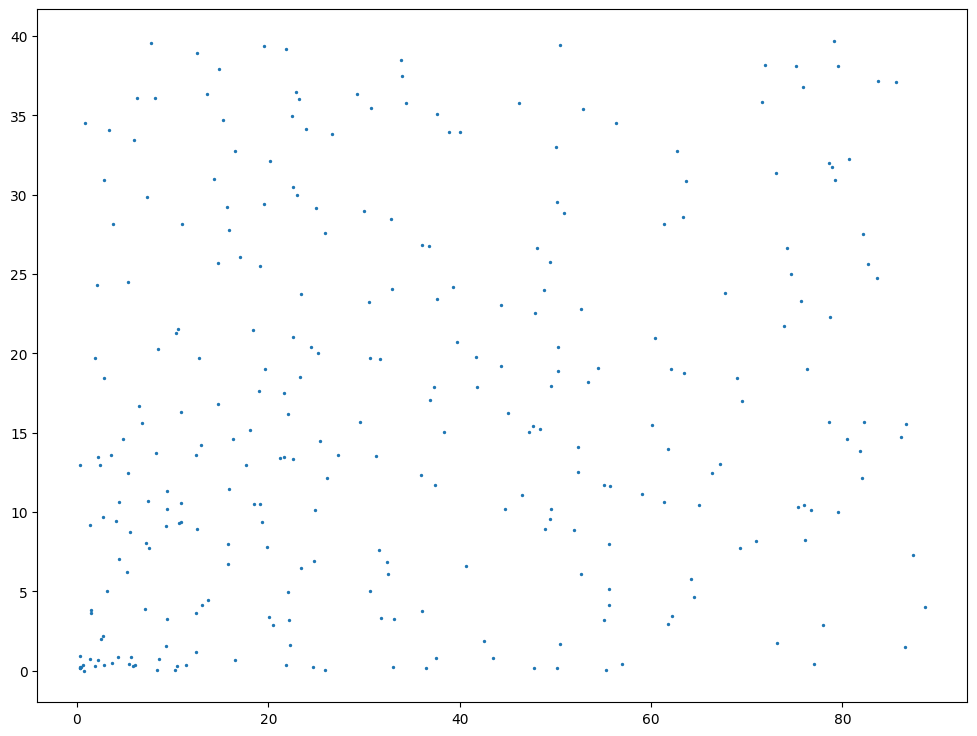

In [29]:
fig, ax = plt.subplots(figsize=(12, 9))
distribution = np.array(distribution)
ax.scatter(distribution[:, 0], distribution[:, 1], s=2)

In [34]:

y_max = 30
x_max = 90
num = 100
rad = 3
log = np.log([[points_amount(x, y, distribution, rad) for y in np.linspace(0, y_max, num)] for x in np.linspace(0, x_max, num)])

<ipython-input-34-9491d7b4b08c>:5: RuntimeWarning: divide by zero encountered in log
  log = np.log([[points_amount(x, y, distribution, rad) for y in np.linspace(0, y_max, num)] for x in np.linspace(0, x_max, num)])


Можно увидеть скопления


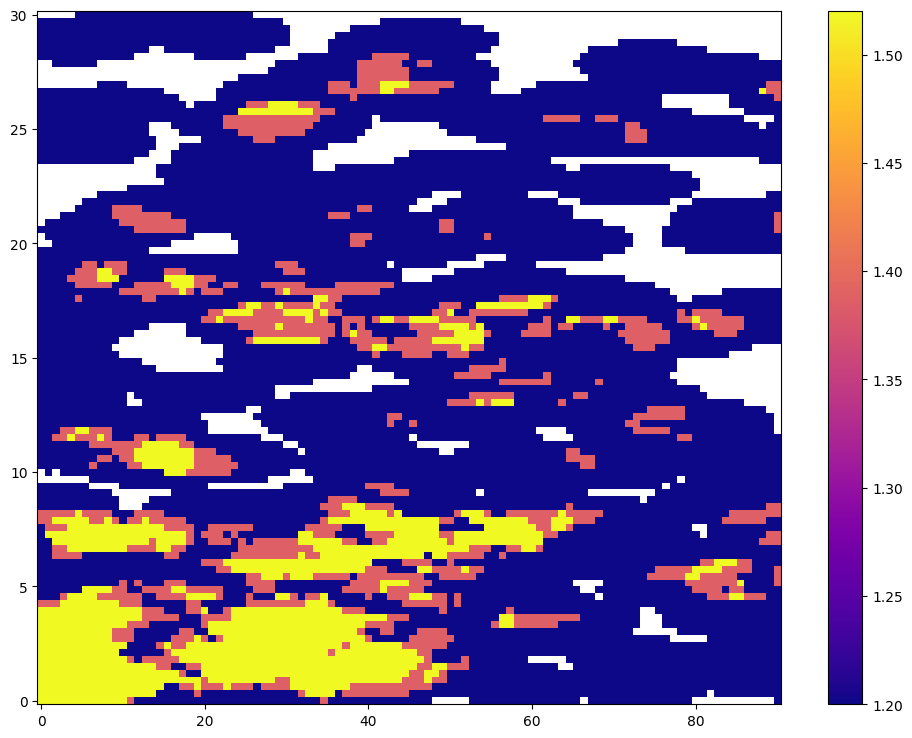

In [35]:
plt.figure(figsize=(12, 9))
plt.pcolormesh(np.linspace(0, x_max, num),
               np.linspace(0, y_max, num),
               log, 
               cmap='plasma',                         
               vmin=1.2, vmax=1.52,  
               shading='auto')
plt.colorbar();